In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.io import imread, imshow
from skimage import data
from skimage.util import img_as_ubyte
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2hsv, rgb2gray, rgb2yuv

image_path = '/content/fyp/Images_all/Chagall_IandTheVillage.jpg'

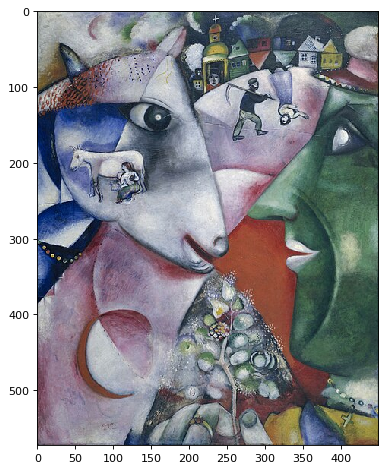

In [ ]:
shawls = imread(image_path)
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(shawls);

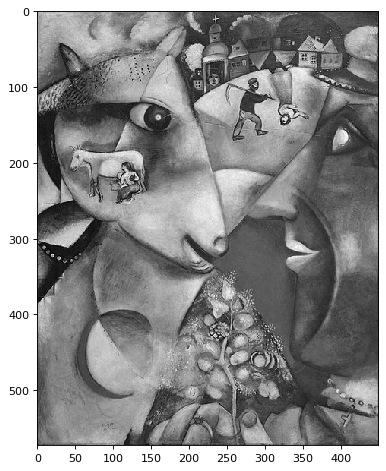

In [ ]:
shawl_gray = rgb2gray(imread(image_path))
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(shawl_gray);

<ipython-input-7-753490edc327>:1: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  entropy_image = entropy(shawl_gray, disk(5))
/usr/local/lib/python3.10/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


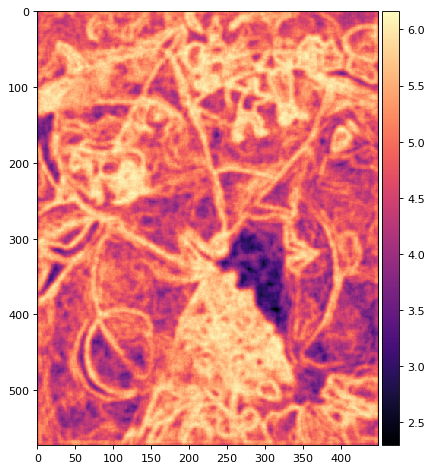

In [ ]:
entropy_image = entropy(shawl_gray, disk(5))
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(entropy_image, cmap = 'magma');

<ipython-input-8-3f7ab6064205>:8: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  ax.imshow(entropy(shawl_gray, disk(radi[n])), cmap =


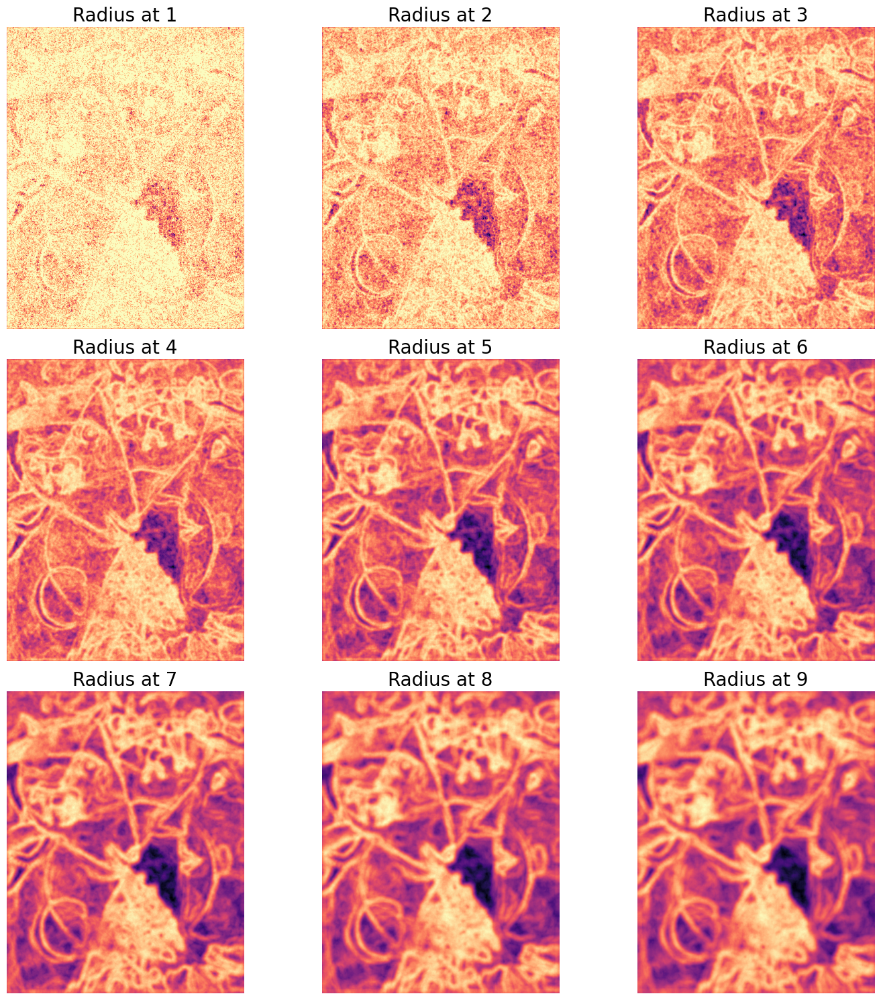

In [ ]:
def disk_iterations(image):
    image_gray = rgb2gray(image)
    f_size = 20
    radi = list(range(1,10))
    fig, ax = plt.subplots(3,3,figsize=(15,15))
    for n, ax in enumerate(ax.flatten()):
        ax.set_title(f'Radius at {radi[n]}', fontsize = f_size)
        ax.imshow(entropy(shawl_gray, disk(radi[n])), cmap =
                  'magma');
        ax.set_axis_off()
    fig.tight_layout()
disk_iterations(shawls)

<ipython-input-9-7a669467bf1d>:4: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  entropy_image = entropy(image_gray, disk(6))


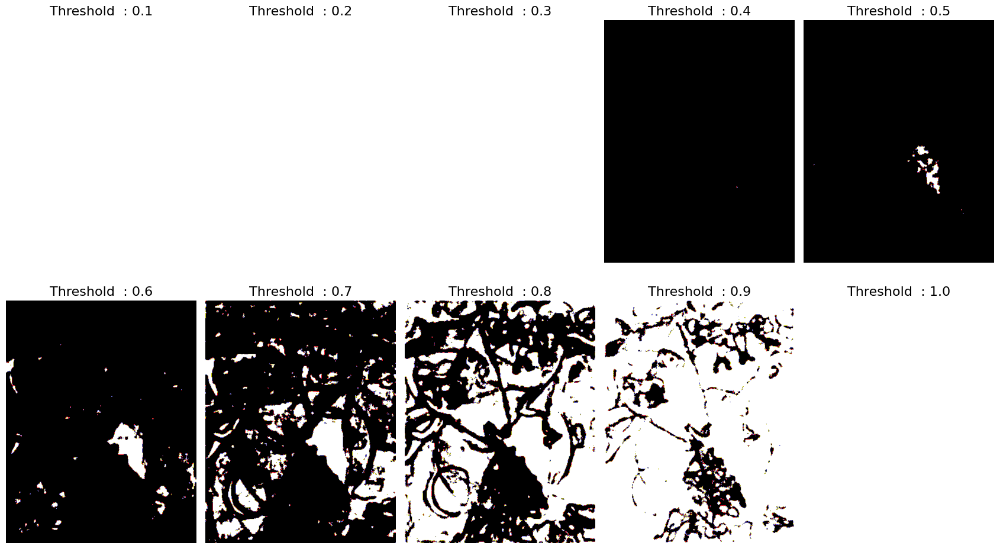

In [ ]:
def threshold_checker(image):
    thresholds =  np.arange(0.1,1.1,0.1)
    image_gray = rgb2gray(image)
    entropy_image = entropy(image_gray, disk(6))
    scaled_entropy = entropy_image / entropy_image.max()
    fig, ax = plt.subplots(2, 5, figsize=(17, 10))
    for n, ax in enumerate(ax.flatten()):
        ax.set_title(f'Threshold  : {round(thresholds[n],2)}',
                     fontsize = 16)
        threshold = scaled_entropy > thresholds[n]
        ax.imshow(threshold, cmap = 'gist_stern_r') ;
        ax.axis('off')
    fig.tight_layout()

threshold_checker(shawls)

<ipython-input-10-2afa2b5c1602>:2: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  entropy_image = entropy(scaled_entropy, disk(6))


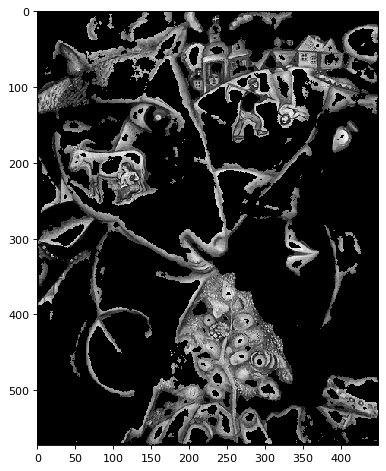

In [ ]:
scaled_entropy = shawl_gray / shawl_gray.max()
entropy_image = entropy(scaled_entropy, disk(6))
scaled_entropy = entropy_image / entropy_image.max()
mask = scaled_entropy > 0.85
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(shawl_gray * mask, cmap = 'gray');


<ipython-input-11-88af7868612c>:3: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  entropy_image = entropy(image_gray, disk(6))


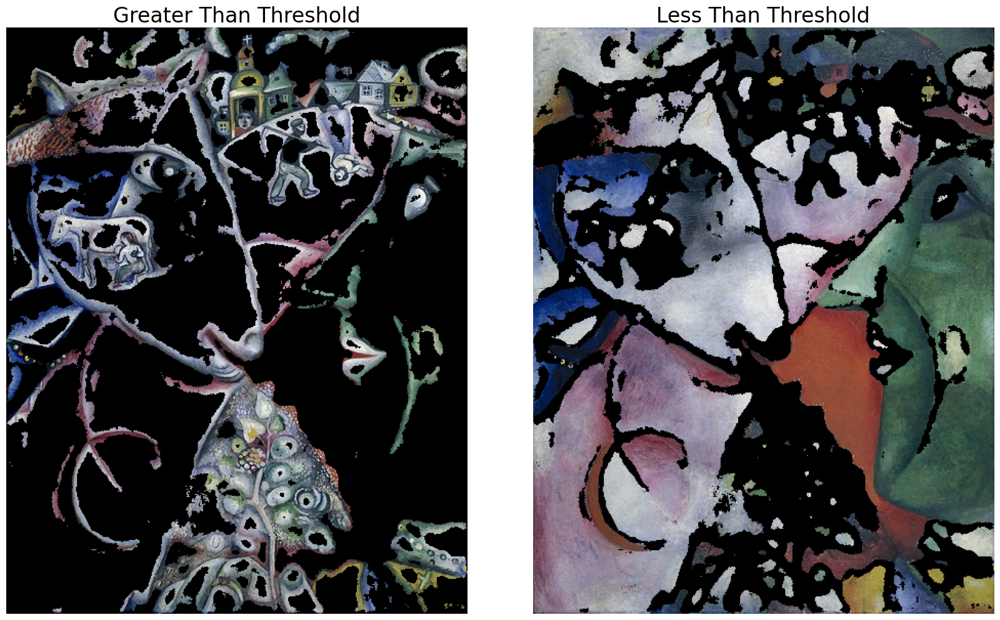

In [ ]:
def entropy_mask_viz(image):
    image_gray = rgb2gray(image)
    entropy_image = entropy(image_gray, disk(6))
    scaled_entropy = entropy_image / entropy_image.max()
    f_size = 24
    fig, ax = plt.subplots(1, 2, figsize=(17, 10))

    ax[0].set_title('Greater Than Threshold',
                     fontsize = f_size)
    threshold = scaled_entropy > 0.85
    image_a = np.dstack([image[:,:,0]*threshold,
                            image[:,:,1]*threshold,
                            image[:,:,2]*threshold])
    ax[0].imshow(image_a)
    ax[0].axis('off')

    ax[1].set_title('Less Than Threshold',
                     fontsize = f_size)
    threshold = scaled_entropy < 0.85
    image_b = np.dstack([image[:,:,0]*threshold,
                            image[:,:,1]*threshold,
                            image[:,:,2]*threshold])
    ax[1].imshow(image_b)
    ax[1].axis('off')
    fig.tight_layout()
    return [image_a, image_b]
entropic_images = entropy_mask_viz(shawls)

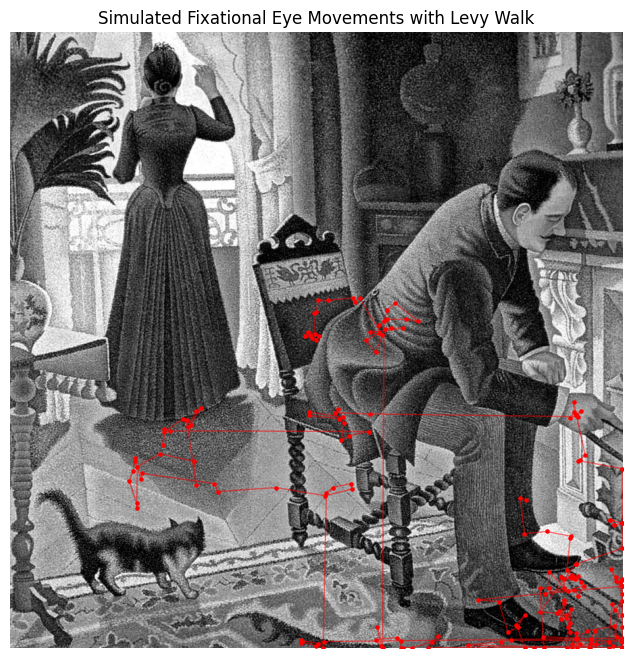

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import gaussian_filter

def levy_walk_step(scale=1, size=1):
    # Generate a step from a Levy distribution
    # The scale parameter determines the step size
    # The size parameter determines the number of steps
    steps = np.random.standard_cauchy(size=size)
    steps = scale * steps
    return steps

def simulate_fixations(image, num_fixations, scale, neighborhood_size):
    # Initialize fixation points array
    fixation_points = np.zeros((num_fixations, 2), dtype=int)
    fixation_points[0] = [image.shape[1] // 2, image.shape[0] // 2]  # Start from the center

    # Calculate image gradients
    dx, dy = np.gradient(image.astype(float))
    gradient_magnitude = np.sqrt(dx**2 + dy**2)

    # Simulate fixational eye movements
    for i in range(1, num_fixations):
        x, y = fixation_points[i-1]
        steps_x, steps_y = levy_walk_step(scale=scale, size=2)

        # Apply Levy walk steps while ensuring boundaries
        next_x = min(max(0, x + int(steps_x)), image.shape[1] - 1)
        next_y = min(max(0, y + int(steps_y)), image.shape[0] - 1)

        # Calculate entropy change
        start_x, end_x = max(0, next_x - neighborhood_size // 2), min(image.shape[1], next_x + neighborhood_size // 2 + 1)
        start_y, end_y = max(0, next_y - neighborhood_size // 2), min(image.shape[0], next_y + neighborhood_size // 2 + 1)
        neighborhood = image[start_y:end_y, start_x:end_x]
        entropy_change = np.sum(np.abs(gradient_magnitude[next_y, next_x] - gradient_magnitude[start_y:end_y, start_x:end_x]))

        # Update fixation point based on entropy maximization and time minimization
        if entropy_change > 0:
            fixation_points[i] = [next_x, next_y]

    return fixation_points

# Load the image
image_path = '/content/fyp/Images_all/Sunday-1888-90-by-Paul-Signac.jpg'
image = np.array(Image.open(image_path).convert('L'))

# Parameters for fixation simulation
num_fixations = 200
scale = 10  # Levy distribution scale parameter
neighborhood_size = 10

# Simulate fixational eye movements
fixation_points = simulate_fixations(image, num_fixations, scale, neighborhood_size)

# Display the image with fixations
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.scatter(fixation_points[:, 0], fixation_points[:, 1], color='red', s=5)
plt.plot(fixation_points[:, 0], fixation_points[:, 1], color='red', linewidth=1, alpha=0.5)
plt.title('Simulated Fixational Eye Movements with Levy Walk')
plt.axis('off')
plt.show()



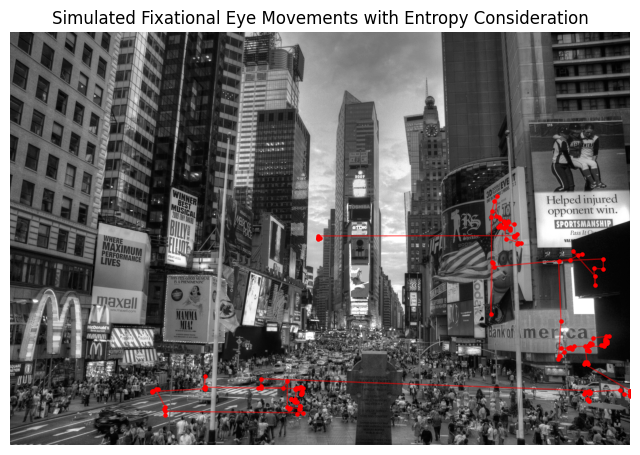

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import gaussian_filter

def levy_walk_step(scale=1, size=1):
    # Generate a step from a Levy distribution
    # The scale parameter determines the step size
    # The size parameter determines the number of steps
    steps = np.random.standard_cauchy(size=size)
    steps = scale * steps
    return steps

def simulate_fixations(image, num_fixations, scale, neighborhood_size):
    # Initialize fixation points array
    fixation_points = np.zeros((num_fixations, 2), dtype=int)
    fixation_points[0] = [image.shape[1] // 2, image.shape[0] // 2]  # Start from the center

    # Calculate image gradients
    dx, dy = np.gradient(image.astype(float))
    gradient_magnitude = np.sqrt(dx**2 + dy**2)

    # Simulate fixational eye movements
    for i in range(1, num_fixations):
        x, y = fixation_points[i-1]
        steps_x, steps_y = levy_walk_step(scale=scale, size=2)

        # Apply Levy walk steps while ensuring boundaries
        next_x = min(max(0, x + int(steps_x)), image.shape[1] - 1)
        next_y = min(max(0, y + int(steps_y)), image.shape[0] - 1)

        # Calculate entropy change
        start_x, end_x = max(0, next_x - neighborhood_size // 2), min(image.shape[1], next_x + neighborhood_size // 2 + 1)
        start_y, end_y = max(0, next_y - neighborhood_size // 2), min(image.shape[0], next_y + neighborhood_size // 2 + 1)
        neighborhood = image[start_y:end_y, start_x:end_x]
        entropy_change = np.sum(np.abs(gradient_magnitude[next_y, next_x] - gradient_magnitude[start_y:end_y, start_x:end_x]))

        # Update fixation point based on entropy maximization and time minimization
        if entropy_change > 0:
            fixation_points[i] = [next_x, next_y]

    return fixation_points

# Load the image
image_path = '/content/fyp/Images_all/New_york_times_square-terabass.jpg'
image = np.array(Image.open(image_path).convert('L'))

# Parameters for fixation simulation
num_fixations = 160
scale = 10  # Levy distribution scale parameter
neighborhood_size = 10

# Simulate fixational eye movements
fixation_points = simulate_fixations(image, num_fixations, scale, neighborhood_size)

# Display the image with fixations
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.scatter(fixation_points[:, 0], fixation_points[:, 1], color='red', s=5)
plt.plot(fixation_points[:, 0], fixation_points[:, 1], color='red', linewidth=1, alpha=0.5)
plt.title('Simulated Fixational Eye Movements with Entropy Consideration')
plt.axis('off')
plt.show()


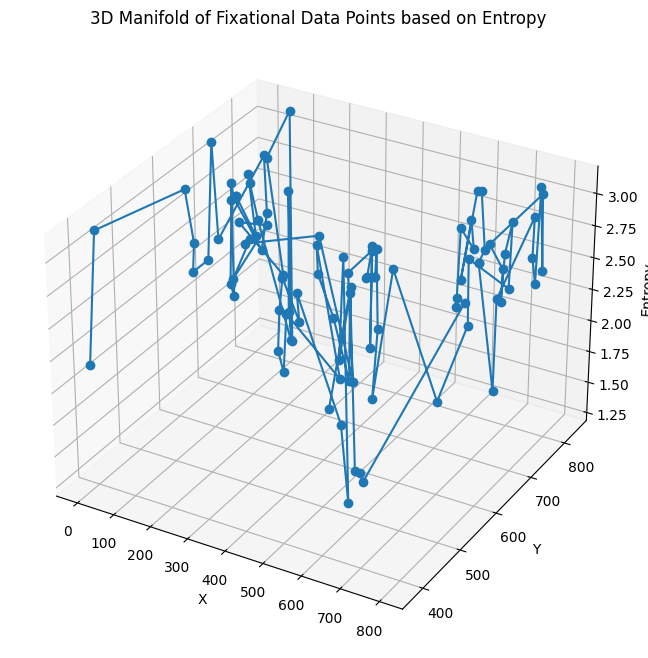

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.measure import shannon_entropy

def levy_walk_step(scale=1, size=1):
    # Generate a step from a Levy distribution
    # The scale parameter determines the step size
    # The size parameter determines the number of steps
    steps = np.random.standard_cauchy(size=size)
    steps = scale * steps
    return steps

def simulate_fixations(image, num_fixations, scale):
    # Initialize fixation points array
    fixation_points = np.zeros((num_fixations, 2), dtype=int)
    fixation_points[0] = [image.shape[1] // 2, image.shape[0] // 2]  # Start from the center

    # Simulate fixational eye movements
    for i in range(1, num_fixations):
        x, y = fixation_points[i-1]
        steps_x, steps_y = levy_walk_step(scale=scale, size=2)

        # Apply Levy walk steps while ensuring boundaries
        next_x = min(max(0, x + int(steps_x)), image.shape[1] - 1)
        next_y = min(max(0, y + int(steps_y)), image.shape[0] - 1)

        # Update fixation point
        fixation_points[i] = [next_x, next_y]

    return fixation_points

# Load the image
image_path = '/content/fyp/Images_all/EquestrianPortraitofCornelius.jpeg'
image = np.array(Image.open(image_path).convert('L'))

# Parameters for fixation simulation
num_fixations = 100
scale = 10  # Levy distribution scale parameter

# Simulate fixational eye movements
fixation_points = simulate_fixations(image, num_fixations, scale)

# Calculate entropy at each fixation point
entropies = np.zeros(num_fixations)
for i, (x, y) in enumerate(fixation_points):
    neighborhood = image[max(0, y - 1):min(image.shape[0], y + 2),
                         max(0, x - 1):min(image.shape[1], x + 2)]
    entropies[i] = shannon_entropy(neighborhood)

# Merge fixational data points over time to create a 3D manifold
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(fixation_points[:, 0], fixation_points[:, 1], entropies, marker='o')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Entropy')
ax.set_title('3D Manifold of Fixational Data Points based on Entropy')
plt.show()


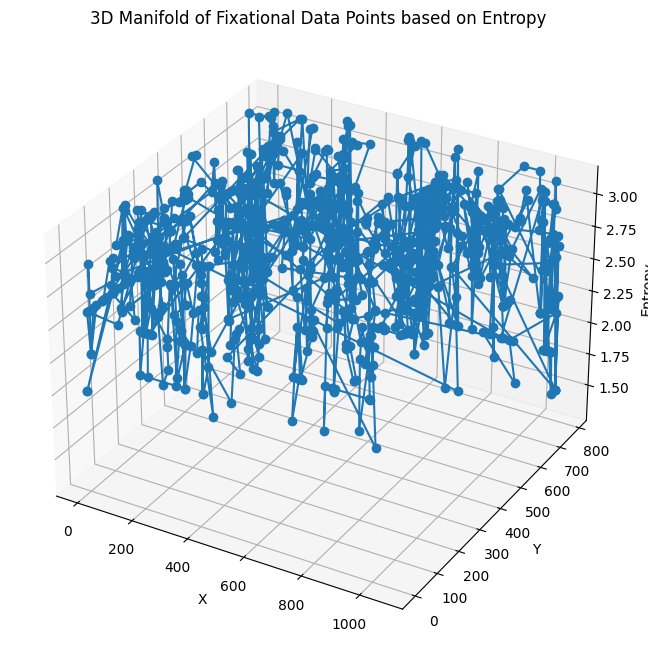

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.measure import shannon_entropy
from mpl_toolkits.mplot3d import Axes3D

def levy_walk_step(scale=1, size=1):
    # Generate a step from a Levy distribution
    steps = np.random.standard_cauchy(size=size)
    steps = scale * steps
    return steps

def simulate_fixations(image, num_fixations, scale):
    # Initialize fixation points array
    fixation_points = np.zeros((num_fixations, 2), dtype=int)
    fixation_points[0] = [image.shape[1] // 2, image.shape[0] // 2]  # Start from the center

    # Simulate fixational eye movements
    for i in range(1, num_fixations):
        x, y = fixation_points[i-1]
        steps_x, steps_y = levy_walk_step(scale=scale, size=2)

        # Apply Levy walk steps while ensuring boundaries
        next_x = min(max(0, x + int(steps_x)), image.shape[1] - 1)
        next_y = min(max(0, y + int(steps_y)), image.shape[0] - 1)

        # Update fixation point
        fixation_points[i] = [next_x, next_y]

    return fixation_points

# Load the image
image_path = '/content/fyp/Images_all/MoMA_9.png'
image = np.array(Image.open(image_path).convert('L'))

# Parameters for fixation simulation
num_fixations = 1000
scale = 10  # Levy distribution scale parameter

# Simulate fixational eye movements
fixation_points = simulate_fixations(image, num_fixations, scale)

# Calculate entropy at each fixation point
entropies = np.zeros(num_fixations)
for i, (x, y) in enumerate(fixation_points):
    neighborhood = image[max(0, y - 1):min(image.shape[0], y + 2),
                         max(0, x - 1):min(image.shape[1], x + 2)]
    entropies[i] = shannon_entropy(neighborhood)

# Merge fixational data points over time to create a 3D manifold
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(fixation_points[:, 0], fixation_points[:, 1], entropies, marker='o', linestyle='-')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Entropy')
ax.set_title('3D Manifold of Fixational Data Points based on Entropy')
plt.show()


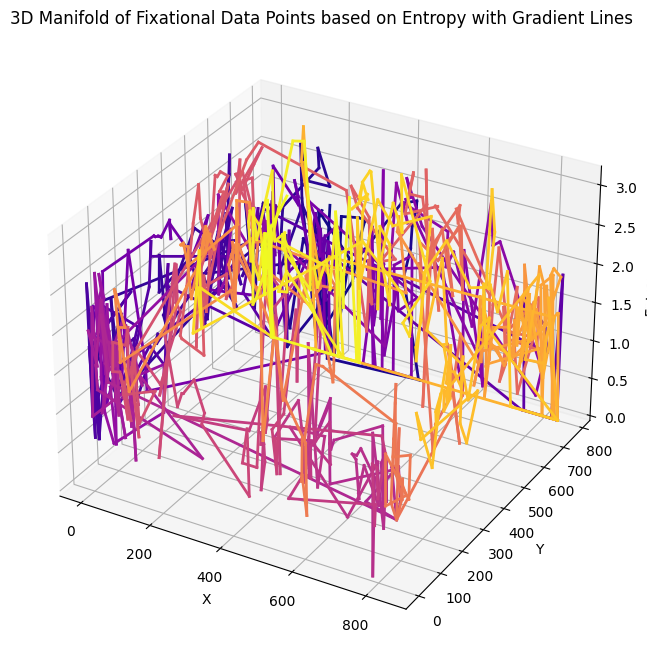

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.measure import shannon_entropy
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

def levy_walk_step(scale=1, size=1):
    # Generate a step from a Levy distribution
    steps = np.random.standard_cauchy(size=size)
    steps = scale * steps
    return steps

def simulate_fixations(image, num_fixations, scale):
    # Initialize fixation points array
    fixation_points = np.zeros((num_fixations, 2), dtype=int)
    fixation_points[0] = [image.shape[1] // 2, image.shape[0] // 2]  # Start from the center

    # Simulate fixational eye movements
    for i in range(1, num_fixations):
        x, y = fixation_points[i-1]
        steps_x, steps_y = levy_walk_step(scale=scale, size=2)

        # Apply Levy walk steps while ensuring boundaries
        next_x = min(max(0, x + int(steps_x)), image.shape[1] - 1)
        next_y = min(max(0, y + int(steps_y)), image.shape[0] - 1)

        # Update fixation point
        fixation_points[i] = [next_x, next_y]

    return fixation_points

# Load the image
image_path = '/content/fyp/Images_all/MoMA_7.png'
image = np.array(Image.open(image_path).convert('L'))

# Parameters for fixation simulation
num_fixations = 1000
scale = 10  # Levy distribution scale parameter

# Simulate fixational eye movements
fixation_points = simulate_fixations(image, num_fixations, scale)

# Calculate entropy at each fixation point
entropies = np.zeros(num_fixations)
for i, (x, y) in enumerate(fixation_points):
    neighborhood = image[max(0, y - 1):min(image.shape[0], y + 2),
                         max(0, x - 1):min(image.shape[1], x + 2)]
    entropies[i] = shannon_entropy(neighborhood)

# Create a colormap for the lines based on the sequence of fixations
colors = np.linspace(0, 1, num_fixations)

# Merge fixational data points over time to create a 3D manifold
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
for i in range(1, num_fixations):
    ax.plot(fixation_points[i-1:i+1, 0], fixation_points[i-1:i+1, 1], entropies[i-1:i+1],
            color=cm.plasma(colors[i]), linewidth=2)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Entropy')
ax.set_title('3D Manifold of Fixational Data Points based on Entropy with Gradient Lines')
plt.show()


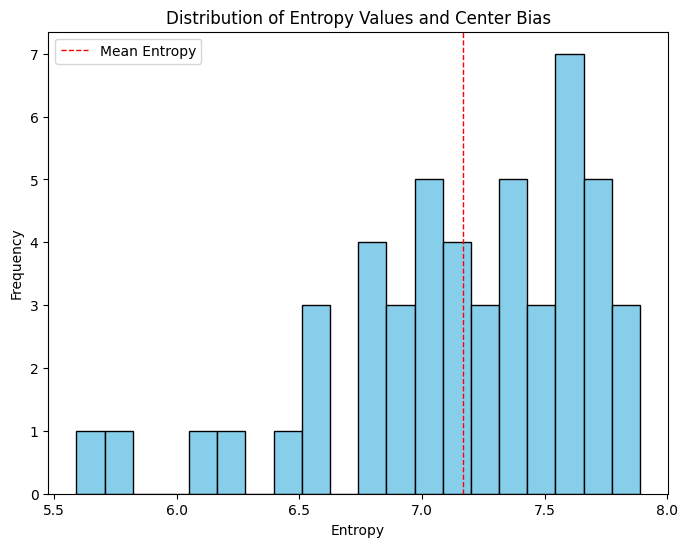

Center Bias (Mean Entropy): 7.166388495183629


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.measure import shannon_entropy

def calculate_entropy(image):
    return shannon_entropy(image)

def analyze_images_in_folder(folder_path):
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

    entropies = []
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = np.array(Image.open(image_path).convert('L'))  # Convert to grayscale
        entropy = calculate_entropy(image)
        entropies.append(entropy)

    return entropies

# Input folder containing images
folder_path = '/content/fyp/Images_all'

# Analyze images in the folder
entropies = analyze_images_in_folder(folder_path)

# Calculate center bias
center_bias = np.mean(entropies)

# Visualize center bias
plt.figure(figsize=(8, 6))
plt.hist(entropies, bins=20, color='skyblue', edgecolor='black')
plt.axvline(center_bias, color='r', linestyle='dashed', linewidth=1, label='Mean Entropy')
plt.xlabel('Entropy')
plt.ylabel('Frequency')
plt.title('Distribution of Entropy Values and Center Bias')
plt.legend()
plt.show()

print(f"Center Bias (Mean Entropy): {center_bias}")


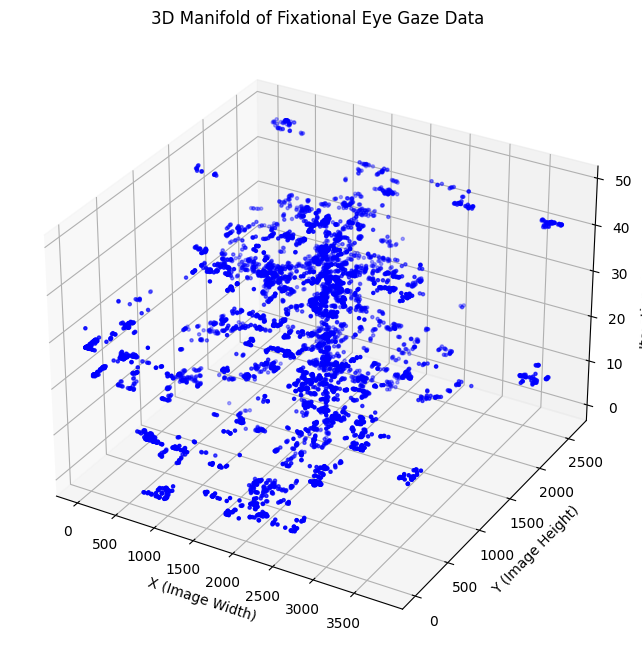

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
from scipy.ndimage import gaussian_filter

def levy_walk_step(scale=1, size=1):
    # Generate a step from a Levy distribution
    # The scale parameter determines the step size
    # The size parameter determines the number of steps
    steps = np.random.standard_cauchy(size=size)
    steps = scale * steps
    return steps

def simulate_fixations(image, num_fixations, scale, neighborhood_size):
    # Initialize fixation points array
    fixation_points = np.zeros((num_fixations, 2), dtype=int)
    fixation_points[0] = [image.shape[1] // 2, image.shape[0] // 2]  # Start from the center

    # Calculate image gradients
    dx, dy = np.gradient(image.astype(float))
    gradient_magnitude = np.sqrt(dx**2 + dy**2)

    # Simulate fixational eye movements
    for i in range(1, num_fixations):
        x, y = fixation_points[i-1]
        steps_x, steps_y = levy_walk_step(scale=scale, size=2)

        # Apply Levy walk steps while ensuring boundaries
        next_x = min(max(0, x + int(steps_x)), image.shape[1] - 1)
        next_y = min(max(0, y + int(steps_y)), image.shape[0] - 1)

        # Calculate entropy change
        start_x, end_x = max(0, next_x - neighborhood_size // 2), min(image.shape[1], next_x + neighborhood_size // 2 + 1)
        start_y, end_y = max(0, next_y - neighborhood_size // 2), min(image.shape[0], next_y + neighborhood_size // 2 + 1)
        neighborhood = image[start_y:end_y, start_x:end_x]
        entropy_change = np.sum(np.abs(gradient_magnitude[next_y, next_x] - gradient_magnitude[start_y:end_y, start_x:end_x]))

        # Update fixation point based on entropy maximization and time minimization
        if entropy_change > 0:
            fixation_points[i] = [next_x, next_y]

    return fixation_points

# Load the image
image_path = '/content/fyp/Images_all/TheAfternoon_LuisMendelez.jpg'
image = np.array(Image.open(image_path).convert('L'))

# Parameters for fixation simulation
num_iterations = 50
num_fixations_per_iteration = 100
scale = 10  # Levy distribution scale parameter
neighborhood_size = 10

# Initialize a list to store all fixation points
all_fixation_points = []

# Iterate over the fixational points generation process
for _ in range(num_iterations):
    # Simulate fixational eye movements for each iteration
    fixation_points = simulate_fixations(image, num_fixations_per_iteration, scale, neighborhood_size)
    all_fixation_points.append(fixation_points)

# Create a 3D manifold of fixational eye gaze data
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

for i, fixation_points in enumerate(all_fixation_points):
    x = fixation_points[:, 0]
    y = fixation_points[:, 1]
    z = np.ones_like(x) * i  # Z-axis represents the iteration number
    ax.scatter(x, y, z, color='b', s=5)

ax.set_xlabel('X (Image Width)')
ax.set_ylabel('Y (Image Height)')
ax.set_zlabel('Iteration Number')
ax.set_title('3D Manifold of Fixational Eye Gaze Data')
plt.show()



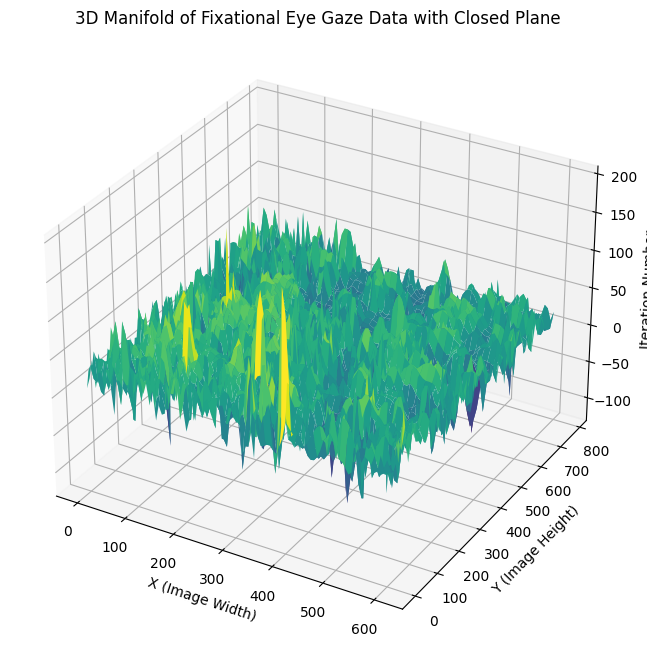

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
from scipy.ndimage import gaussian_filter
from scipy.interpolate import griddata

def levy_walk_step(scale=1, size=1):
    # Generate a step from a Levy distribution
    # The scale parameter determines the step size
    # The size parameter determines the number of steps
    steps = np.random.standard_cauchy(size=size)
    steps = scale * steps
    return steps

def simulate_fixations(image, num_fixations, scale, neighborhood_size):
    # Initialize fixation points array
    fixation_points = np.zeros((num_fixations, 2), dtype=int)
    fixation_points[0] = [image.shape[1] // 2, image.shape[0] // 2]  # Start from the center

    # Calculate image gradients
    dx, dy = np.gradient(image.astype(float))
    gradient_magnitude = np.sqrt(dx**2 + dy**2)

    # Simulate fixational eye movements
    for i in range(1, num_fixations):
        x, y = fixation_points[i-1]
        steps_x, steps_y = levy_walk_step(scale=scale, size=2)

        # Apply Levy walk steps while ensuring boundaries
        next_x = min(max(0, x + int(steps_x)), image.shape[1] - 1)
        next_y = min(max(0, y + int(steps_y)), image.shape[0] - 1)

        # Calculate entropy change
        start_x, end_x = max(0, next_x - neighborhood_size // 2), min(image.shape[1], next_x + neighborhood_size // 2 + 1)
        start_y, end_y = max(0, next_y - neighborhood_size // 2), min(image.shape[0], next_y + neighborhood_size // 2 + 1)
        neighborhood = image[start_y:end_y, start_x:end_x]
        entropy_change = np.sum(np.abs(gradient_magnitude[next_y, next_x] - gradient_magnitude[start_y:end_y, start_x:end_x]))

        # Update fixation point based on entropy maximization and time minimization
        if entropy_change > 0:
            fixation_points[i] = [next_x, next_y]

    return fixation_points

# Load the image
image_path = '/content/fyp/Images_all/MoMA_11.png'
image = np.array(Image.open(image_path).convert('L'))


# Parameters for fixation simulation
num_iterations = 50
num_fixations_per_iteration = 100
scale = 10  # Levy distribution scale parameter
neighborhood_size = 10

# Initialize a list to store all fixation points
all_fixation_points = []

# Iterate over the fixational points generation process
for _ in range(num_iterations):
    # Simulate fixational eye movements for each iteration
    fixation_points = simulate_fixations(image, num_fixations_per_iteration, scale, neighborhood_size)
    all_fixation_points.append(fixation_points)

# Create a closed plane or trend using interpolation
x_coords = []
y_coords = []
z_coords = []

for i, fixation_points in enumerate(all_fixation_points):
    x_coords.extend(fixation_points[:, 0])
    y_coords.extend(fixation_points[:, 1])
    z_coords.extend([i] * len(fixation_points))

# Interpolate to create a smooth surface
x_range = np.linspace(0, image.shape[1], num=100)
y_range = np.linspace(0, image.shape[0], num=100)
X, Y = np.meshgrid(x_range, y_range)
Z = griddata((x_coords, y_coords), z_coords, (X, Y), method='cubic')

# Plot the surface
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')
ax.set_xlabel('X (Image Width)')
ax.set_ylabel('Y (Image Height)')
ax.set_zlabel('Iteration Number')
ax.set_title('3D Manifold of Fixational Eye Gaze Data with Closed Plane')
plt.show()


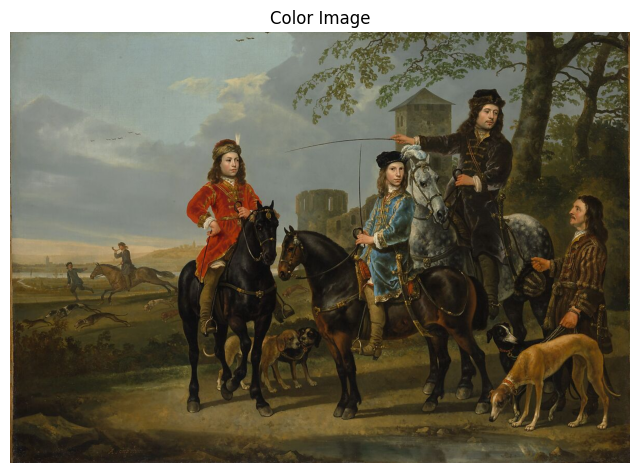

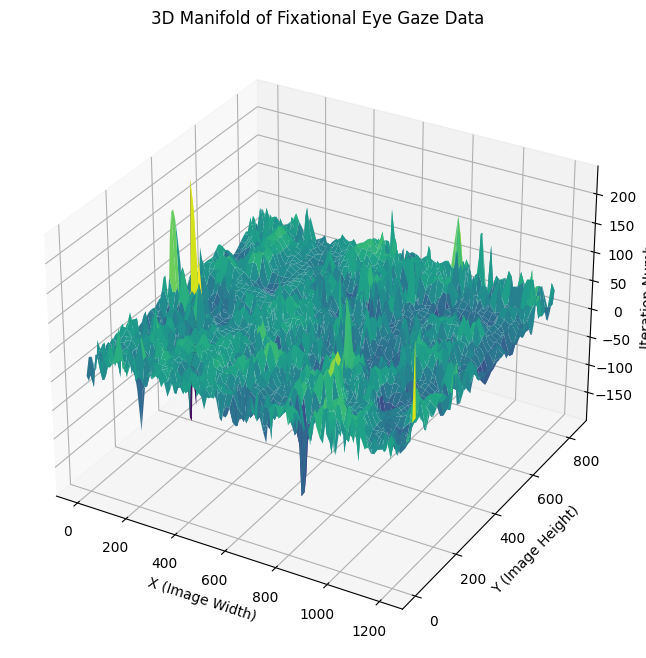

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
from scipy.ndimage import gaussian_filter
from scipy.interpolate import griddata

def levy_walk_step(scale=1, size=1):
    # Generate a step from a Levy distribution
    # The scale parameter determines the step size
    # The size parameter determines the number of steps
    steps = np.random.standard_cauchy(size=size)
    steps = scale * steps
    return steps

def simulate_fixations(image, num_fixations, scale, neighborhood_size):
    # Initialize fixation points array
    fixation_points = np.zeros((num_fixations, 2), dtype=int)
    fixation_points[0] = [image.shape[1] // 2, image.shape[0] // 2]  # Start from the center

    # Calculate image gradients
    dx, dy = np.gradient(image.astype(float))
    gradient_magnitude = np.sqrt(dx**2 + dy**2)

    # Simulate fixational eye movements
    for i in range(1, num_fixations):
        x, y = fixation_points[i-1]
        steps_x, steps_y = levy_walk_step(scale=scale, size=2)

        # Apply Levy walk steps while ensuring boundaries
        next_x = min(max(0, x + int(steps_x)), image.shape[1] - 1)
        next_y = min(max(0, y + int(steps_y)), image.shape[0] - 1)

        # Calculate entropy change
        start_x, end_x = max(0, next_x - neighborhood_size // 2), min(image.shape[1], next_x + neighborhood_size // 2 + 1)
        start_y, end_y = max(0, next_y - neighborhood_size // 2), min(image.shape[0], next_y + neighborhood_size // 2 + 1)
        neighborhood = image[start_y:end_y, start_x:end_x]
        entropy_change = np.sum(np.abs(gradient_magnitude[next_y, next_x] - gradient_magnitude[start_y:end_y, start_x:end_x]))

        # Update fixation point based on entropy maximization and time minimization
        if entropy_change > 0:
            fixation_points[i] = [next_x, next_y]

    return fixation_points

# Load the image
image_path = '/content/fyp/Images_all/EquestrianPortraitofCornelius.jpeg'
image = np.array(Image.open(image_path).convert('RGB'))

# Parameters for fixation simulation
num_iterations = 50
num_fixations_per_iteration = 100
scale = 10  # Levy distribution scale parameter
neighborhood_size = 10

# Initialize a list to store all fixation points
all_fixation_points = []

# Iterate over the fixational points generation process
for _ in range(num_iterations):
    # Simulate fixational eye movements for each iteration
    fixation_points = simulate_fixations(image[:, :, 0], num_fixations_per_iteration, scale, neighborhood_size)
    all_fixation_points.append(fixation_points)

# Plot the color image
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')
plt.title('Color Image')
plt.show()

# Create a closed plane or trend using interpolation
x_coords = []
y_coords = []
z_coords = []

for i, fixation_points in enumerate(all_fixation_points):
    x_coords.extend(fixation_points[:, 0])
    y_coords.extend(fixation_points[:, 1])
    z_coords.extend([i] * len(fixation_points))

# Interpolate to create a smooth surface
x_range = np.linspace(0, image.shape[1], num=100)
y_range = np.linspace(0, image.shape[0], num=100)
X, Y = np.meshgrid(x_range, y_range)
Z = griddata((x_coords, y_coords), z_coords, (X, Y), method='cubic')

# Plot the surface
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')

ax.set_xlabel('X (Image Width)')
ax.set_ylabel('Y (Image Height)')
ax.set_zlabel('Iteration Number')
ax.set_title('3D Manifold of Fixational Eye Gaze Data')
plt.show()
